<a href="https://colab.research.google.com/github/pertvirt/hello_world/blob/master/kz_similar_images_finder_exp1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Load data

In [0]:
import glob

all_files = glob.glob("input/hotailorJPG/**/*.jpg", recursive=True)

len(all_files)

710

In [0]:
import PIL
from PIL import Image
import numpy as np

imgs_list = []
org_imgs_list = []
for image in all_files:
    imgs_list.append(np.array(Image.open(image).resize((224,224))))
    org_imgs_list.append(np.array(Image.open(image).resize((500,500))))

imgs_np = np.asarray(imgs_list)#, dtype=np.float32)# / 255
org_imgs_np = np.asarray(org_imgs_list)#, dtype=np.float32)# / 255

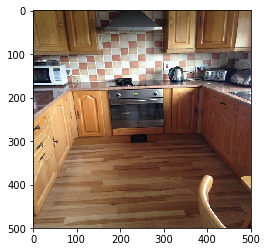

In [0]:
import matplotlib.pyplot as plt
%matplotlib inline
plt.imshow(org_imgs_np[0])

from keras.preprocessing import image
from keras.applications.vgg16 import preprocess_input

imgs = []
for file in all_files:
    img = image.load_img(file, target_size=(224, 224))
    x = image.img_to_array(img)
    x = np.expand_dims(x, axis=0)
    x = preprocess_input(x)
    imgs.append(x)
    
imgs = np.asarray(imgs)

In [0]:
imgs_np.shape

(710, 224, 224, 3)

## Load base pretrained model (feature extractor)

In [0]:
import keras

# more recent versions of keras have even more pretrained models (ResNet150, ResNetV2, etc.)
from keras.applications.vgg19 import VGG19
from keras.applications.resnet50 import ResNet50
from keras.applications.inception_v3 import InceptionV3
from keras.applications.densenet import DenseNet201, DenseNet121

#base = VGG19(weights='imagenet')
base = ResNet50(weights='imagenet')
#base = DenseNet201(weights='imagenet')
#base = InceptionV3(weights='imagenet')

In [0]:
base.summary()

## Create new model using base model and remove last fully connected layer (classification layer)

In [0]:
from keras.layers import Input
from keras import Model

model = Model(input=base.input, output=[base.layers[-2].output])

/anaconda/envs/py35/lib/python3.5/site-packages/ipykernel_launcher.py:4: UserWarning: Update your `Model` call to the Keras 2 API: `Model(inputs=Tensor("in..., outputs=[<tf.Tenso...)`
  after removing the cwd from sys.path.


## Preprocessed input

In [0]:
x = imgs_np.copy()

In [0]:
# each pretrained model requires different preprocess step
from keras.applications.resnet50 import preprocess_input
#from keras.applications.densenet import preprocess_input
#from keras.applications.vgg19 import preprocess_input

x = preprocess_input(x)

## Extract features (encoddings) using base model

In [0]:
features = model.predict(x)

In [0]:
features.shape

(710, 2048)

## Find nearest neighbors using euclidean distance

In [0]:
from sklearn.neighbors import NearestNeighbors
knn = NearestNeighbors(n_neighbors=5, metric='euclidean')
knn.fit(features)

NearestNeighbors(algorithm='auto', leaf_size=30, metric='euclidean',
         metric_params=None, n_jobs=1, n_neighbors=5, p=2, radius=1.0)

In [0]:
predictions = knn.kneighbors(features, 10)

In [0]:
pred = predictions[1] # 0 - array of distances (ascending), 1 - array of coresponding indexes of similar images

In [0]:
pred

array([[  0,  28,  38, ...,  13,  32,  54],
       [  1, 409,  39, ...,  46, 103,  43],
       [  2, 446,  38, ..., 472,  22,  24],
       ...,
       [707, 709, 593, ..., 620, 670, 271],
       [708, 696, 686, ..., 586, 664, 647],
       [709, 696, 656, ..., 698, 593, 661]])

## Plot predictions

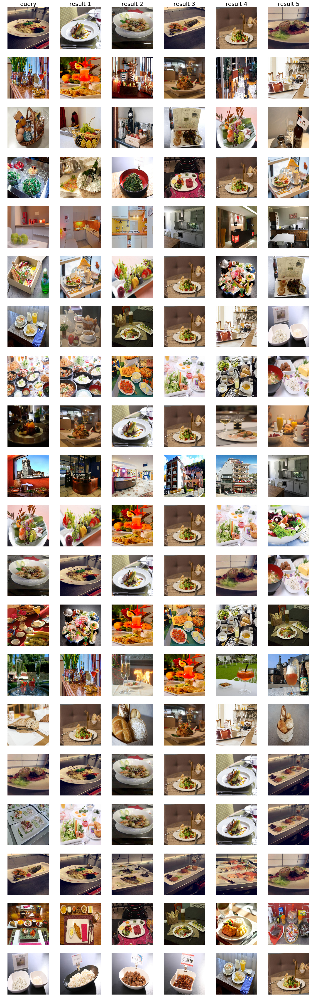

In [0]:
import matplotlib.pyplot as plt
%matplotlib inline

im_id = 650 # start plotting images from that ID
nm_neighbors = 5 # how many top similar images to show
nm_neighbors += 1 # ignore that - its needed for correct plotting
nm_img_to_plot = 20 # how many image queries to plot

fig, axes = plt.subplots(nm_img_to_plot, nm_neighbors, figsize=(nm_neighbors*4, nm_img_to_plot*4))
axes[0, 0].set_title("query", fontsize=25)
for i in range(1, nm_neighbors):
    axes[0, i].set_title("result %s" % i, fontsize=25) 
for m in range(0, nm_img_to_plot):    
    for n in range(0, nm_neighbors):
        axes[m, n].axis('off')
        axes[m, n].imshow(org_imgs_np[pred[im_id][n]])
    im_id += 1